## This notebook is going to show the OLCI analysis

In [131]:
import xarray as xr
import hvplot.xarray
import hvplot.pandas
import cartopy.crs as crs
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import pandas as pd
import geopandas as gpd

The goal of this notebook is to pull in OLCI chla and Rrs data and then use GOES SST data to delineate our frontal eddy and using that delineation pull out the Rrs data and see how the spectra changes across time in the eddy.

I could also seriously consider just a simple transect across the eddy and showing how that changes.

First let's look at GOES

In [2]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:492: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [3]:
goes_4h = goes_ds.sea_surface_temperature.resample(time='4H').mean(skipna=True)

Promising times and scene IDs
- 2021-09-08T15:06:01.083433Z
  - S3B_OL_2_WFR____20210908T150601_20210908T150901_20210910T002357_0179_056_353_2340_MAR_O_NT_003
- 2021-09-06T14:56:40.180325Z
  - S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003
- 2021-09-05T15:22:51.229524Z
  - S3A_OL_2_WFR____20210905T152251_20210905T152551_20210907T035656_0179_076_068_2340_MAR_O_NT_003
- 2021-09-04T15:09:45.844880Z
  - S3B_OL_2_WFR____20210904T150946_20210904T151246_20210906T043354_0179_056_296_2340_MAR_O_NT_003
- 2021-08-31T15:13:30.521883Z
  - S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003
- 2021-08-27T15:17:15.136914Z
  - S3B_OL_2_WFR____20210827T151715_20210827T152015_20210829T034615_0179_056_182_2340_MAR_O_NT_003
- 2021-08-25T15:07:54.666991Z
  - S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003
- 2021-08-12T15:06:01.826509Z
  - S3B_OL_2_WFR____20210812T150602_20210812T150902_20210814T025047_0179_055_353_2340_MAR_O_NT_003
- 2021-08-09T15:22:53.064980Z
  - S3A_OL_2_WFR____20210809T152253_20210809T152553_20210811T032752_0179_075_068_2340_MAR_O_NT_003

 

    

In [14]:
goes_4h[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), coastline=True, rasterize=True)

:DynamicMap   [time]
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (sea_surface_temperature)
      .Coastline.I :Feature   [Longitude,Latitude]

#### Now pull in OLCI 

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


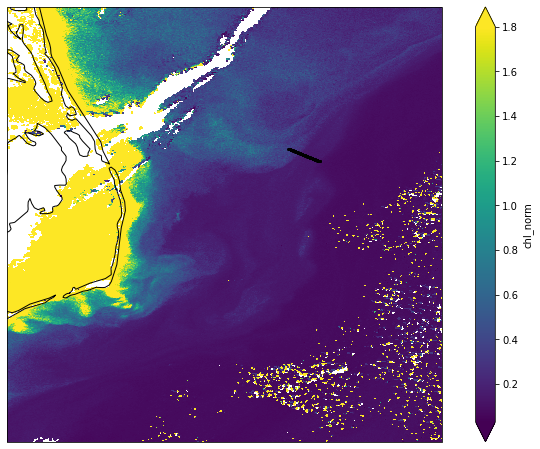

In [36]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.03, vmax=1.8), cmap='viridis')
df_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='black', alpha=1)
# fig.savefig('olci_chla_sept0614.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [4]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']

Pull in OLCI data

Data downloaded from https://coda.eumetsat.int/#/home

scene id = S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003

In [5]:
import matplotlib 

matplotlib.rcParams.update({'font.size': 12})

In [10]:
! ls data/olci/S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003.SEN3

Oa01_reflectance.nc  Oa12_reflectance.nc  par.nc
Oa02_reflectance.nc  Oa16_reflectance.nc  tie_geo_coordinates.nc
Oa03_reflectance.nc  Oa17_reflectance.nc  tie_geometries.nc
Oa04_reflectance.nc  Oa18_reflectance.nc  tie_meteo.nc
Oa05_reflectance.nc  Oa21_reflectance.nc  time_coordinates.nc
Oa06_reflectance.nc  chl_nn.nc		  trsp.nc
Oa07_reflectance.nc  chl_oc4me.nc	  tsm_nn.nc
Oa08_reflectance.nc  geo_coordinates.nc   w_aer.nc
Oa09_reflectance.nc  instrument_data.nc   wqsf.nc
Oa10_reflectance.nc  iop_nn.nc		  xfdumanifest.xml
Oa11_reflectance.nc  iwv.nc


In [344]:
#open dataset in xarray
folder = 'S3B_OL_2_WFR____20210827T151715_20210827T152015_20210829T034615_0179_056_182_2340_MAR_O_NT_003.SEN3'

nc_chl = xr.open_dataset('data/olci/'+ folder +'/chl_oc4me.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('data/olci/'+ folder +'/geo_coordinates.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds['chl_norm'] = 10**olci_ds.CHL_OC4ME
olci_ds 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4090)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

In [345]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet')

:DynamicMap   []
   :Image   [lon,lat]   (CHL_OC4ME)

From here we'll make some xarray datasets to select across a certain lat and lon range

In [347]:
aug31_y_list = np.arange(34.4, 33.4, -0.002)
aug27_y_list = np.arange(34.43, 33.2, -0.002)
aug25_y_list = np.arange(34.01, 32.9, -0.002)

In [348]:
aug31_x_list = np.arange(-77.2, -75.5, 0.002)
aug27_x_list = np.arange(-76.73, -75.59, 0.002)
aug25_x_list = np.arange(-77.7, -75.2, 0.002)

In [349]:
len(aug27_x_list), len(aug27_y_list)

(571, 615)

In [292]:
41.982257 - 41.981968

0.00028899999999509873

In [350]:
import math
math.floor(idx*ratio)

554

In [351]:
y_list = aug27_y_list
x_list = aug27_x_list

# I want to find the speed at a certain lat/lon point.
lat_list = []
lon_list = []
chla_list = []
xloc_list = []
yloc_list = []

ratio = len(y_list)/len(x_list)

for idx in range(len(x_list)):
# for idx in range(300):

    lat = y_list[math.floor(idx*ratio)]
    lon = x_list[idx]

    # First, find the index of the grid point nearest a specific lat/lon.   
    abslat = np.abs(olci_ds.lat-lat)
    abslon = np.abs(olci_ds.lon-lon)
    c = np.maximum(abslon, abslat)

    try:
        ([yloc], [xloc]) = np.where(c == np.min(c))

    except ValueError:
        # sometimes there are two equally near and I just grab the first one
        yloc = np.where(c == np.min(c))[0][0]
        xloc = np.where(c == np.min(c))[1][0]
        
    xloc_list.append(xloc)
    yloc_list.append(yloc)
    
    
    if idx % 50 == 0:
        print(idx)

    # Now I can use that index location to get the values at the x/y diminsion
    point_ds = olci_ds.sel(columns=xloc, rows=yloc)

    chla_list.append(point_ds.chl_norm.values)
    lat_list.append(point_ds.lat.values)
    lon_list.append(point_ds.lon.values)


0
50
100
150
200
250
300
350
400
450
500
550


In [301]:
for i in range(len(xloc_list)):
    point_ds = olci_ds.sel(columns=xloc_list[i], rows=yloc_list[i])
#     print(point_ds.chl_norm.values)

In [353]:
df = pd.DataFrame(list(zip(lat_list,lon_list)), columns=['lat', 'lon'])

df['olci_chla'] = [float(x) for x in chla_list]

points_gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))

Aug 25th

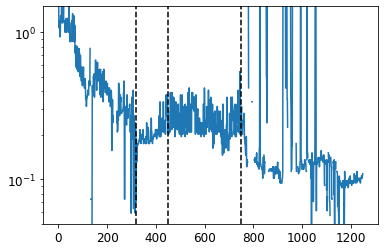

In [337]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(320, c='k', ls='--')
plt.axvline(450, c='k', ls='--')
plt.axvline(750, c='k', ls='--')
plt.ylim(0.05,1.5)
plt.yscale('log')

Aug 27th

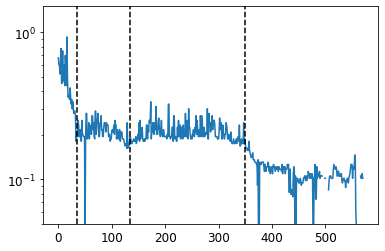

In [365]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(35, c='k', ls='--')
plt.axvline(135, c='k', ls='--')
plt.axvline(350, c='k', ls='--')
plt.ylim(0.05,1.5)
plt.yscale('log')

Aug 31st

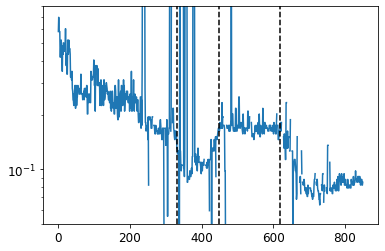

In [259]:
plt.plot(points_gdf.olci_chla)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(330, c='k', ls='--')

plt.axvline(450, c='k', ls='--')
plt.axvline(620, c='k', ls='--')
plt.ylim(0.05,.8)
plt.yscale('log')

(-79.0, -74.0)

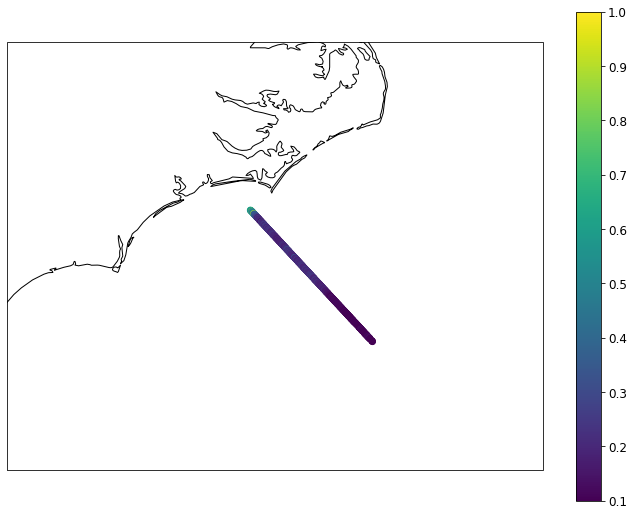

In [355]:
fig, ax = plt.subplots(figsize=(12,9), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
points_gdf.plot(column='olci_chla', legend=True, ax=ax, vmin=0.1,vmax=1)
ax.set_ylim(32,36)
ax.set_xlim(-79,-74)

In [356]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.hvplot.points('lon', 'lat', geo=True)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

In [368]:
olci_ds_bands.Oa03_reflectance.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(0,0.04), rasterize=True, cmap='jet') * df.hvplot.points('lon', 'lat', geo=True)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (Oa03_reflectance)
      .Points.I :Points   [lon,lat]

now see how bands respond

In [367]:
# folder = 'S3A_OL_2_WFR____20210825T150755_20210825T151055_20210827T040652_0179_075_296_2340_MAR_O_NT_003.SEN3'
#open dataset in xarray
nc_band1 = xr.open_dataset('data/olci/' + folder + '/Oa01_reflectance.nc') #path to chlorophyll file 
nc_band2 = xr.open_dataset('data/olci/' + folder + '/Oa02_reflectance.nc') #path to chlorophyll file 
nc_band3 = xr.open_dataset('data/olci/' + folder + '/Oa03_reflectance.nc') #path to chlorophyll file 
nc_band4 = xr.open_dataset('data/olci/' + folder + '/Oa04_reflectance.nc') #path to chlorophyll file 
nc_band5 = xr.open_dataset('data/olci/' + folder + '/Oa05_reflectance.nc') #path to chlorophyll file 
nc_band6 = xr.open_dataset('data/olci/' + folder + '/Oa06_reflectance.nc') #path to chlorophyll file 
nc_band7 = xr.open_dataset('data/olci/' + folder + '/Oa07_reflectance.nc') #path to chlorophyll file 
nc_band8 = xr.open_dataset('data/olci/' + folder + '/Oa08_reflectance.nc') #path to chlorophyll file 
nc_band9 = xr.open_dataset('data/olci/' + folder + '/Oa09_reflectance.nc') #path to chlorophyll file 
nc_band10 = xr.open_dataset('data/olci/' + folder + '/Oa10_reflectance.nc') #path to chlorophyll file 
nc_band11 = xr.open_dataset('data/olci/' + folder + '/Oa11_reflectance.nc') #path to chlorophyll file 

# n_coord =xr.open_dataset('data/olci/S3B_OL_2_WFR____20210831T151331_20210831T151631_20210902T015858_0179_056_239_2340_MAR_O_NT_003.SEN3/geo_coordinates.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_band1],[nc_band2],[nc_band3],[nc_band4],[nc_band5],[nc_band6],[nc_band7],[nc_band8],[nc_band9],[nc_band10],[nc_band11], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds_bands = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds_bands 

<xarray.Dataset>
Dimensions:               (columns: 4865, rows: 4090)
Coordinates:
    lat                   (rows, columns) float64 ...
    lon                   (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    Oa01_reflectance      (rows, columns) float32 ...
    Oa01_reflectance_err  (rows, columns) float32 ...
    Oa02_reflectance      (rows, columns) float32 ...
    Oa02_reflectance_err  (rows, columns) float32 ...
    Oa03_reflectance      (rows, columns) float32 ...
    Oa03_reflectance_err  (rows, columns) float32 ...
    Oa04_reflectance      (rows, columns) float32 ...
    Oa04_reflectance_err  (rows, columns) float32 ...
    Oa05_reflectance      (rows, columns) float32 ...
    Oa05_reflectance_err  (rows, columns) float32 ...
    Oa06_reflectance      (rows, columns) float32 ...
    Oa06_reflectance_err  (rows, columns) float32 ...
    Oa07_reflectance      (rows, columns) float32 ...
    Oa07_reflectance_err  (rows, columns) float32 ...
    Oa08_reflectance      (rows, columns) float32 ...
    Oa08_reflectance_err  (rows, columns) float32 ...
    Oa09_reflectance      (rows, columns) float32 ...
    Oa09_reflectance_err  (rows, columns) float32 ...
    Oa10_reflectance      (rows, columns) float32 ...
    Oa10_reflectance_err  (rows, columns) float32 ...
    Oa11_reflectance      (rows, columns) float32 ...
    Oa11_reflectance_err  (rows, columns) float32 ...
    altitude              (rows, columns) float32 ...

In [369]:
band_names = ['Oa01_reflectance','Oa02_reflectance','Oa03_reflectance','Oa04_reflectance','Oa05_reflectance','Oa06_reflectance',
                 'Oa07_reflectance','Oa08_reflectance','Oa09_reflectance','Oa10_reflectance', 'Oa11_reflectance']
aug27_olci_reflectance = []
for i in range(len(xloc_list)):
    point_ds = olci_ds_bands.sel(columns=xloc_list[i], rows=yloc_list[i])
    spectra = []
    for band in band_names:
            spectra.append(float(point_ds[band].values))
    aug27_olci_reflectance.append(spectra)

In [370]:
aug27_olci_reflectance = np.array(aug27_olci_reflectance)

In [371]:
aug27_olci_reflectance.shape

(571, 11)

In [316]:
np.nanmean(olci_reflectance,axis=0).shape

(11,)

In [322]:
wavelengths = np.array([400,412.5,442.5,490,510,560,620,665,673.75,681.25,708.75])

In [247]:
olci_reflectance.shape

(851, 11)

(0.0, 0.04)

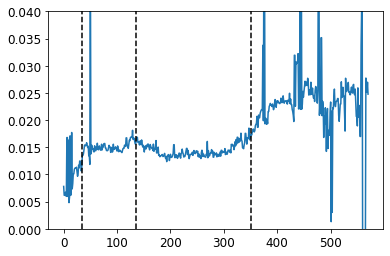

In [372]:
plt.plot(aug27_olci_reflectance[:,2])
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())

plt.axvline(35, c='k', ls='--')
plt.axvline(135, c='k', ls='--')
plt.axvline(350, c='k', ls='--')
plt.ylim(0.0,0.04)
# plt.yscale('log')

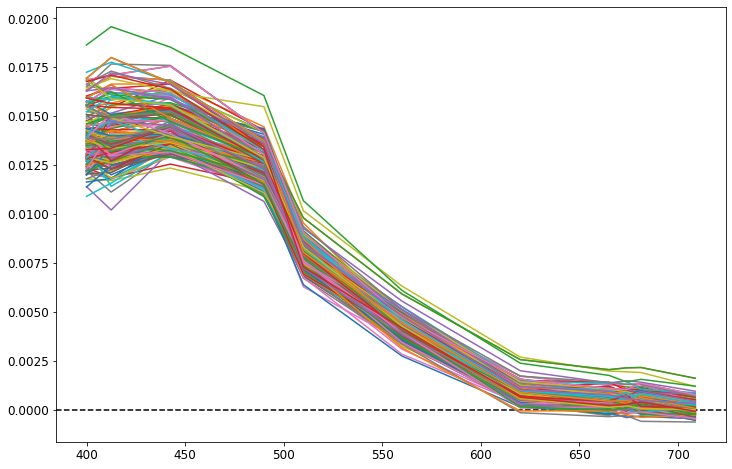

In [373]:
fig, ax = plt.subplots(figsize=(12,8))
ax.axhline(0, c='k', ls='--')

ax.plot(wavelengths, aug27_olci_reflectance[135:350,:].T)
# ax.set_ylim(0,0.028)
plt.show()

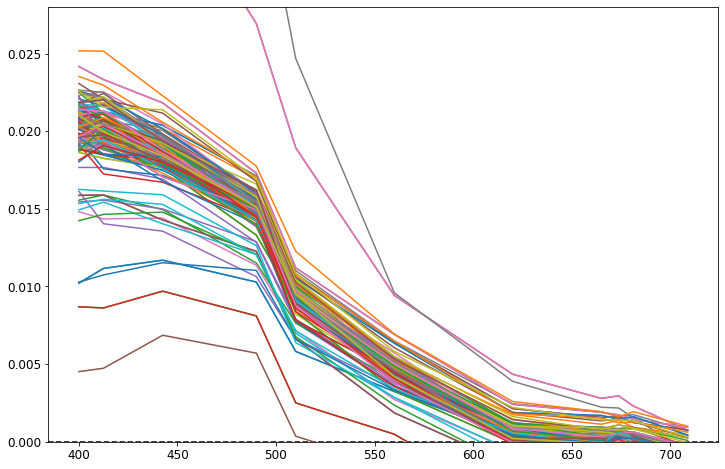

In [272]:
fig, ax = plt.subplots(figsize=(12,8))
ax.axhline(0, c='k', ls='--')

ax.plot(wavelengths, olci_reflectance[450:620,:].T)
ax.set_ylim(0,0.028)
plt.show()

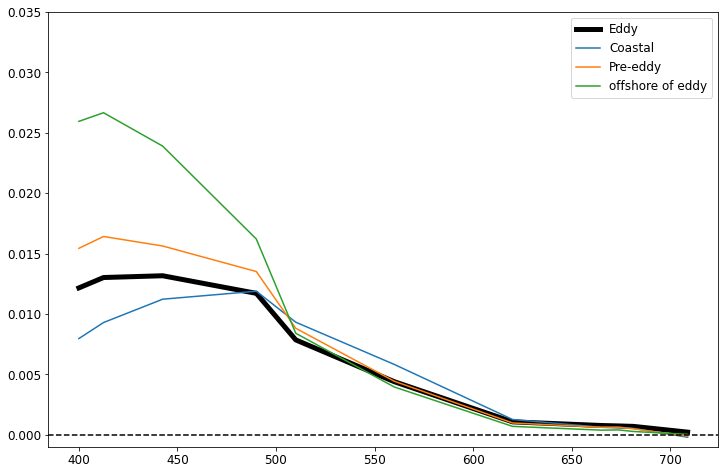

In [341]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(aug25_olci_reflectance[450:750,:],axis=0), label='Eddy', color='k', lw=5)


ax.plot(wavelengths, np.nanmedian(aug25_olci_reflectance[:320,:],axis=0), label='Coastal')
ax.plot(wavelengths, np.nanmedian(aug25_olci_reflectance[320:450,:],axis=0), label='Pre-eddy')
ax.plot(wavelengths, np.nanmedian(aug25_olci_reflectance[750:,:],axis=0), label='offshore of eddy')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.035)
plt.savefig('olci_eddy_250821.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

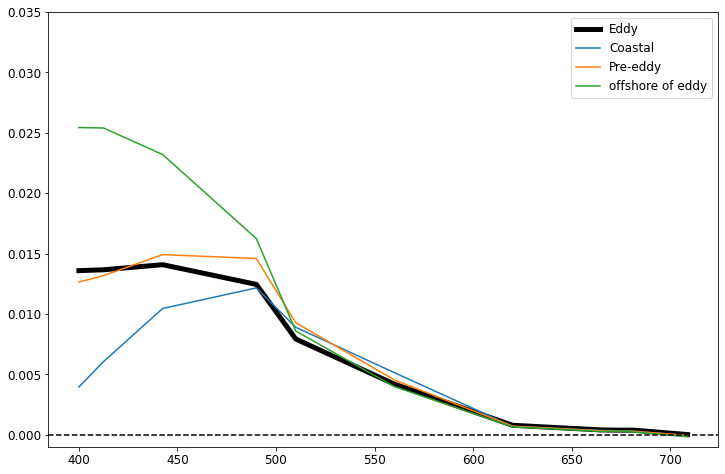

In [374]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(aug27_olci_reflectance[135:350,:],axis=0), label='Eddy', color='k', lw=5)


ax.plot(wavelengths, np.nanmedian(aug27_olci_reflectance[:35,:],axis=0), label='Coastal')
ax.plot(wavelengths, np.nanmedian(aug27_olci_reflectance[35:135,:],axis=0), label='Pre-eddy')
ax.plot(wavelengths, np.nanmedian(aug27_olci_reflectance[350:,:],axis=0), label='offshore of eddy')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.035)
# plt.savefig('olci_eddy_270821.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

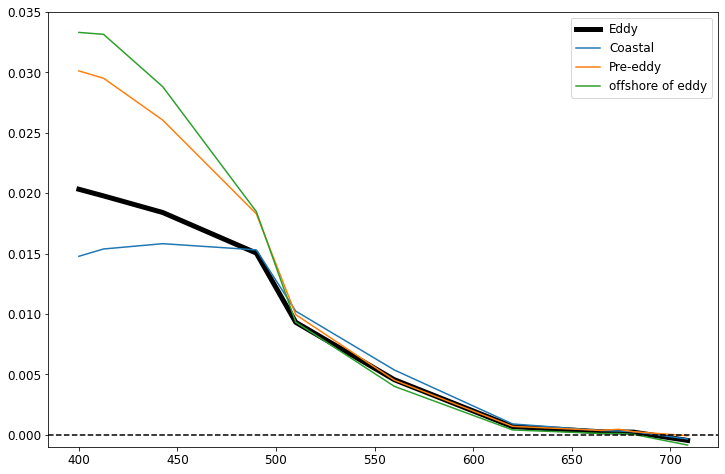

In [277]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(wavelengths, np.nanmedian(olci_reflectance[450:620,:],axis=0), label='Eddy', color='k', lw=5)


ax.plot(wavelengths, np.nanmedian(olci_reflectance[:330,:],axis=0), label='Coastal')
ax.plot(wavelengths, np.nanmedian(olci_reflectance[330:420,:],axis=0), label='Pre-eddy')
ax.plot(wavelengths, np.nanmedian(olci_reflectance[620:,:],axis=0), label='offshore of eddy')

ax.legend()
ax.axhline(0, c='k', ls='--')

ax.set_ylim(-0.001,0.035)
plt.savefig('olci_eddy_310821.png',dpi=450)

# ax.plot(wavelengths, olci_reflectance.T)
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)-np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
# ax.plot(wavelengths, np.nanmean(olci_reflectance[450:620,:],axis=0)+np.nanstd(olci_reflectance[450:620,:],axis=0), c='k')
plt.show()

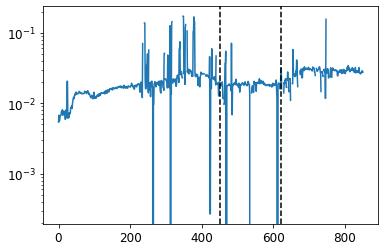

In [191]:
plt.plot(points_gdf.Oa03_reflectance)
# plt.plot(points_gdf.olci_chla.rolling(5, min_periods=3).median())
plt.axvline(450, c='k', ls='--')
plt.axvline(620, c='k', ls='--')
# plt.ylim(0.05,.8)
plt.yscale('log')

In [200]:
np.nanmean(points_gdf.Oa03_reflectance.iloc[450:620])

0.01790613061692341

In [212]:
np.nanmedian([float(x) for x in points_gdf.Oa03_reflectance.iloc[450:620]])

0.01839655637741089

In [199]:
np.nanstd(points_gdf.Oa03_reflectance.iloc[450:620])

0.007976311183446404

In [16]:
#open dataset in xarray
nc_chl = xr.open_dataset('data/olci/chl_oc4me_20210905T144335.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('data/olci/geo_coordinates_20210905T144335.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds_sept5 = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds_sept5['chl_norm'] = 10**olci_ds_sept5.CHL_OC4ME
olci_ds_sept5 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4090)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

In [17]:
olci_ds_sept5 = olci_ds_sept5.sel( columns=slice(0,1000), rows=slice(2000,3000))

In [99]:
olci_ds_sept5.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

In [29]:
import cmocean

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


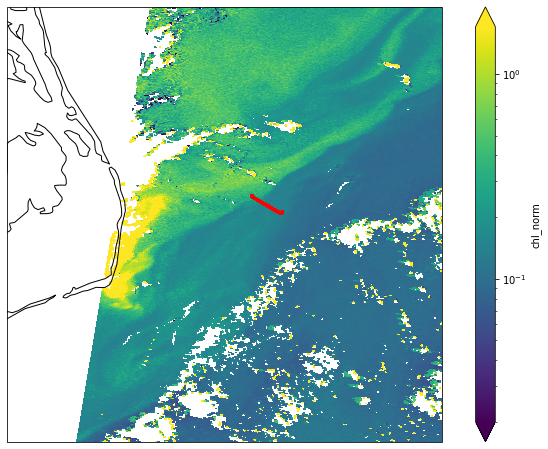

In [46]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds_sept5.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.02, vmax=1.7), cmap='viridis')
df_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=4, color='red', alpha=1)
fig.savefig('olci_chla_sept0515.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [80]:
olci_ds.chl_norm[1000:1900,1800:3000].lon.max()

<xarray.DataArray 'lon' ()>
array(-69.426455)

In [81]:
olci_ds = olci_ds.sel( rows=slice(1800,3000), columns=slice(1000,1900))

In [82]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


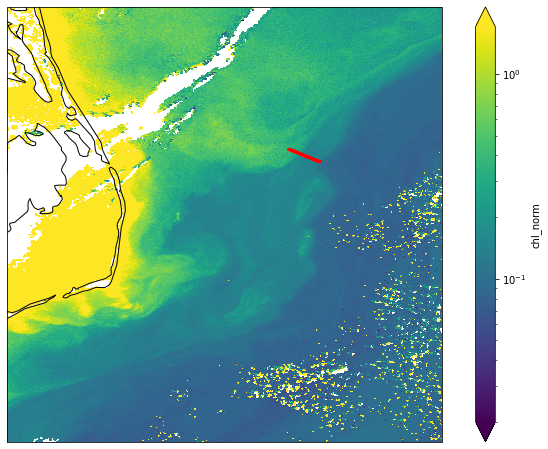

In [45]:
fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.02, vmax=1.7), cmap='viridis')
df_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='red', alpha=1)
fig.savefig('olci_chla_sept0614.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [2]:
import pandas as pd
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime
import numpy as np
df = pd.read_csv("data/sept_cruise/SW21011R_RFP/EventData/DataLogger/Data every 1 min_001.elg")

date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')